<a href="https://colab.research.google.com/github/WilliamShengYangHuang/AALU_Coding/blob/main/Hue_Analysis_beta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import pandas as pd
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import os

from google.colab import drive

In [2]:
drive.mount('/content/drive')
folder_path = '/content/drive/My Drive/aa_images/28-nov'  #@param{type:'string'}

Mounted at /content/drive


## Define Methods

In [3]:
# Define pivot colours in HSV format
pivot_colours_hsv = {
    "red": (0, 255, 255),
    "orange": (30, 255, 255),
    "yellow": (60, 255, 255),
    "green": (90, 255, 255),
    "cyan": (120, 255, 255),
    "blue": (150, 255, 255),
    "violet": (180, 255, 255),
    "magenta": (210, 255, 255)
}

def closest_pivot_colour(hsv_color, pivot_colours_hsv):
    # Compare only the Hue value for simplicity
    hue = hsv_color[0]
    distances = [abs(hue - pivot_hue) for pivot_hue, _, _ in pivot_colours_hsv.values()]
    closest_color_index = np.argmin(distances)
    return list(pivot_colours_hsv.keys())[closest_color_index]

def process_image(img_path, pivot_colours_hsv):
    img = cv2.imread(img_path)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    output_img = np.zeros_like(img)

    color_stats = {color: 0 for color in pivot_colours_hsv}

    for i in range(img_hsv.shape[0]):
        for j in range(img_hsv.shape[1]):
            closest_color = closest_pivot_colour(img_hsv[i, j], pivot_colours_hsv)
            output_img[i, j] = cv2.cvtColor(np.uint8([[pivot_colours_hsv[closest_color]]]), cv2.COLOR_HSV2BGR)[0][0]
            color_stats[closest_color] += 1

    total_pixels = img_hsv.shape[0] * img_hsv.shape[1]
    color_stats_percentage = {color: count / total_pixels for color, count in color_stats.items()}

    return cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB), color_stats_percentage



## Process Images and Display Results

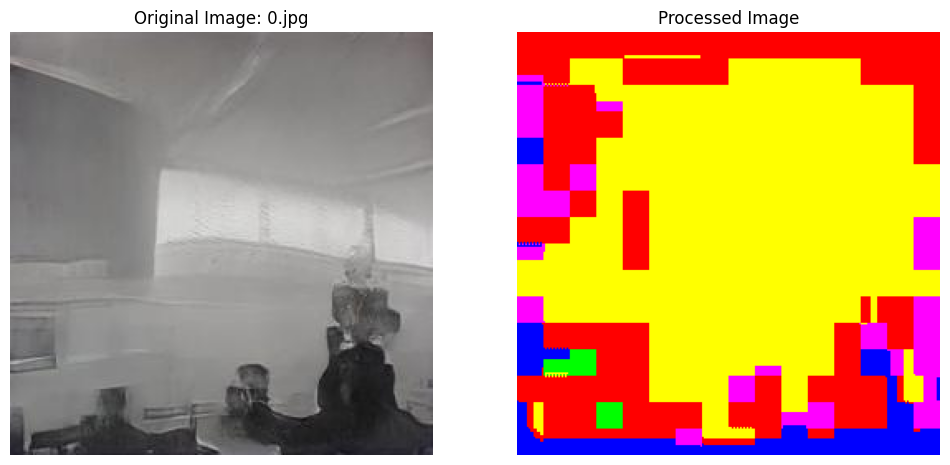

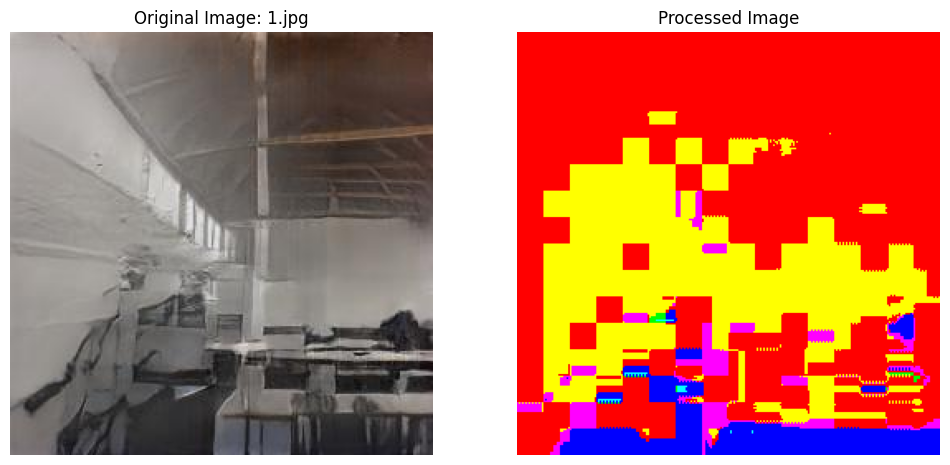

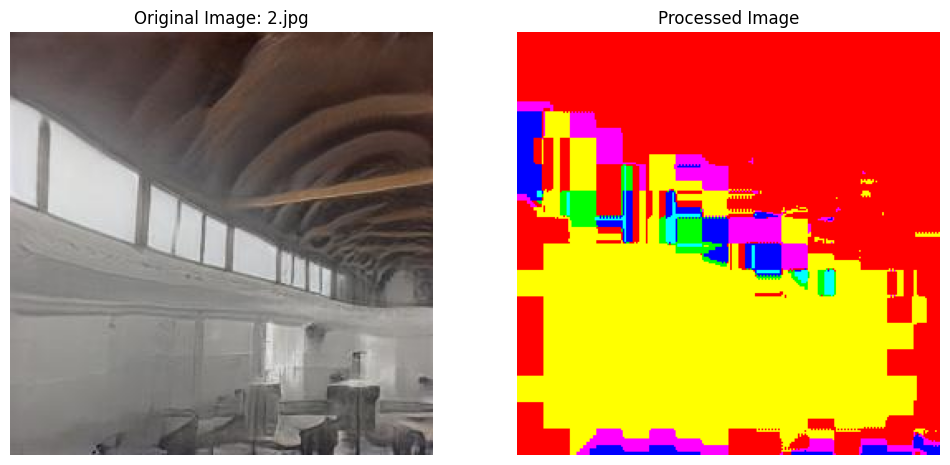

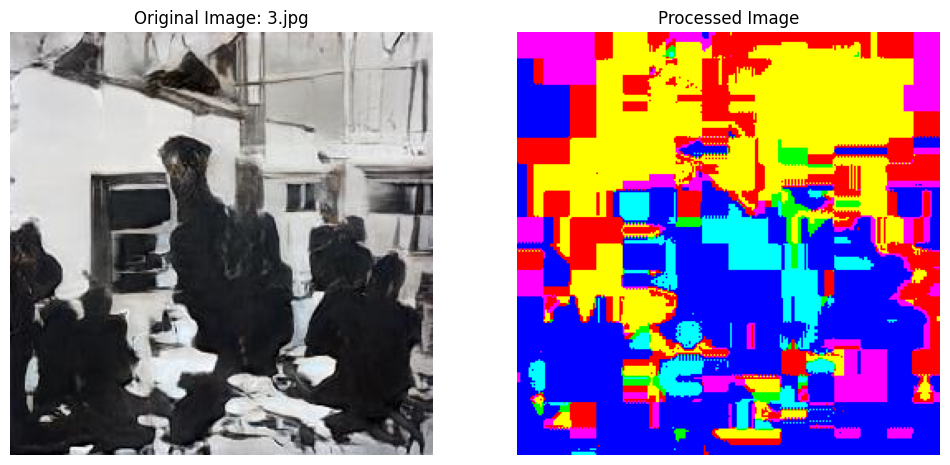

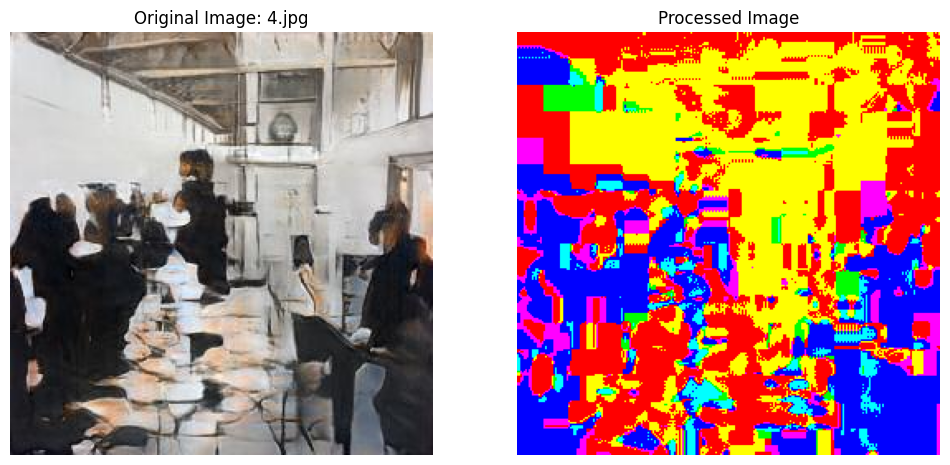

...

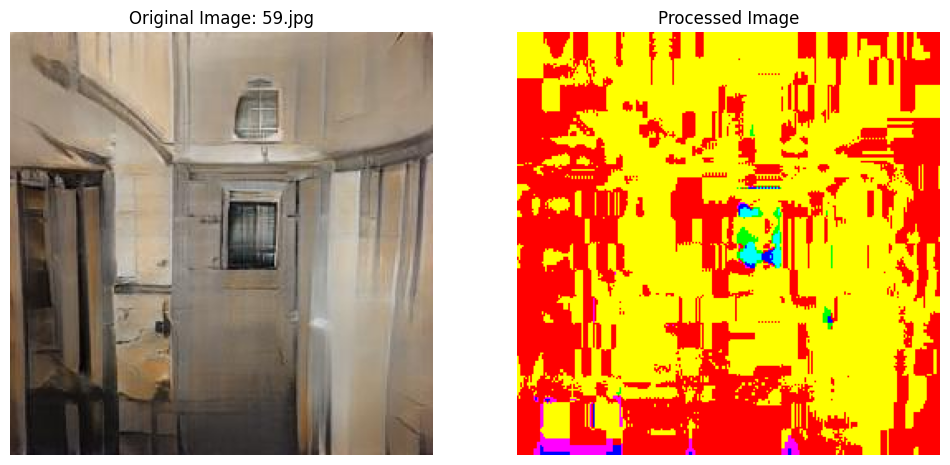

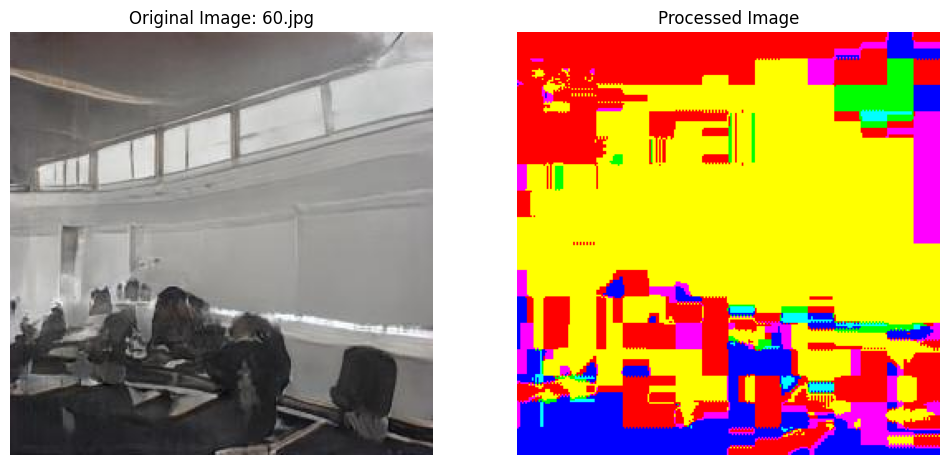

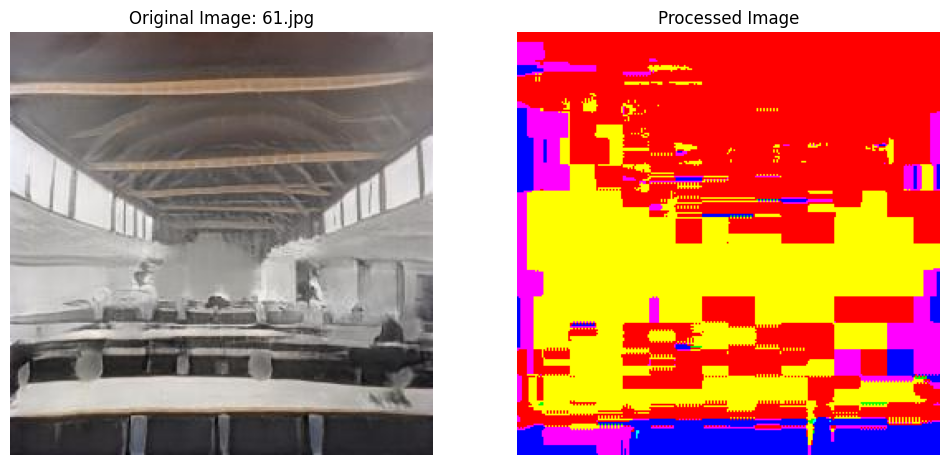

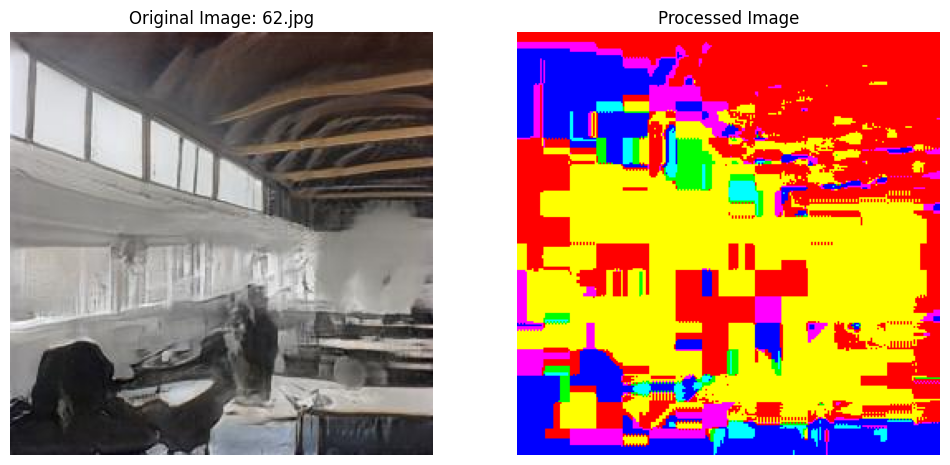

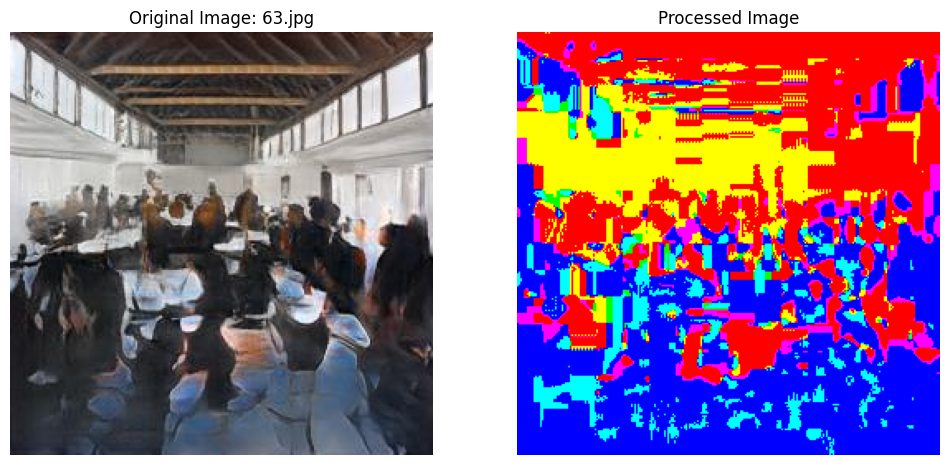

In [4]:
all_colour_stats = pd.DataFrame()

for filename in os.listdir(folder_path):
    if filename.endswith(".jpg") or filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        output_image, color_statistics = process_image(img_path, pivot_colours_hsv)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.imread(img_path)[..., ::-1])
        plt.title(f'Original Image: {filename}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(output_image)
        plt.title('Processed Image')
        plt.axis('off')

        plt.show()

        all_colour_stats[filename] = pd.Series(color_statistics)

all_colour_stats = all_colour_stats.T



## Save Data

In [5]:
# Save to CSV
saving_path = '/content/drive/My Drive/processed_colour_stats.csv' #@param{type:'string'}
all_colour_stats.to_csv(saving_path)
print('done')

done
